# Image load 

In [319]:
%matplotlib inline
import sys
sys.path.append('..')
import matplotlib.pyplot as plt
from converter.common_utils import hdf5_reader
import numpy as np

path = '/staff/shijun/torch_projects/COVID-19_CLS/dataset/npy_data/CP/3473.hdf5'
img = hdf5_reader(path,'img')

# Show

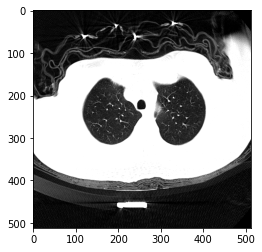

In [2]:
plt.imshow(img[12],cmap='gray')
plt.show()

# Crop and Resize 

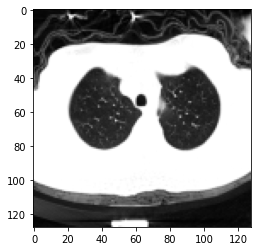

In [2]:
from skimage.transform import resize

dim = (img.shape[0],128,128)
crop_img = img[:,48:-48,48:-48]
resize_img = resize(crop_img,dim,anti_aliasing=True)

plt.imshow(resize_img[12],cmap='gray')
plt.show()

# CropResize Class Test

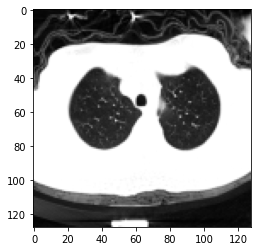

In [2]:
from transform import CropResize

dim = (img.shape[0],128,128)
sample= {'image':img,'label':1}

cr_cls = CropResize(dim,48)

cr_img = cr_cls(sample)['image']

plt.imshow(cr_img[12],cmap='gray')
plt.show()

(58, 512, 512)
(58, 128, 128)


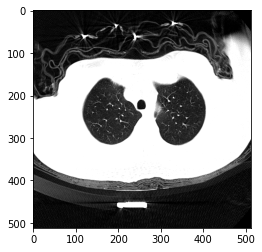

1.0


In [4]:
print(sample['image'].shape)
print(cr_img.shape)

plt.imshow(img[12],cmap='gray')
plt.show()
print(np.max(img))

# To_Tensor Class Test

In [3]:
from transform import To_Tensor

tt_cls = To_Tensor(3)
tt_img = tt_cls(cr_cls(sample))['image']
tt_lab = tt_cls(cr_cls(sample))['label']
print(tt_img.shape)
print(tt_lab)

torch.Size([1, 58, 128, 128])
tensor([0., 1., 0.])


# Translation, Rotation, Zoom, keep the orginal shape

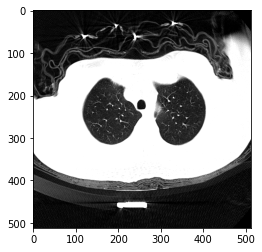

In [20]:
from skimage.transform import warp
from transforms3d.euler import euler2mat
from transforms3d.affines import compose

def get_tform_coords(im_size):
      coords0, coords1, coords2 = np.mgrid[:im_size[0], :im_size[1], :im_size[2]]
      coords = np.array([coords0 - im_size[0] / 2, coords1 - im_size[1] / 2, coords2 - im_size[2] / 2])
      return np.append(coords.reshape(3, -1), np.ones((1, np.prod(im_size))), axis=0)



def data_enhance_3d(image):
  
      im_size = image.shape
    
      tform_coords = get_tform_coords(im_size)
      translation = [0, np.random.uniform(-10, 10), np.random.uniform(-10, 10)]
      rotation = euler2mat(np.random.uniform(-10, 10) / 180.0 * np.pi, 0, 0, 'sxyz')
      scale = [1, np.random.uniform(0.9, 1.1), np.random.uniform(0.9, 1.1)]
      warp_mat = compose(translation, rotation, scale)
      
      w = np.dot(warp_mat, tform_coords)
      w[0] = w[0] + im_size[0] / 2
      w[1] = w[1] + im_size[1] / 2
      w[2] = w[2] + im_size[2] / 2
      warp_coords = w[0:3].reshape(3, im_size[0], im_size[1], im_size[2])

      final_image = warp(image, warp_coords)

      return final_image

    

plt.imshow(img[12],cmap='gray')
plt.show()


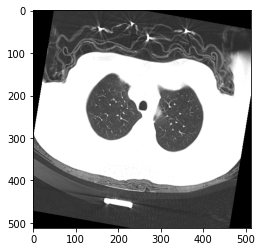

In [21]:
trz_img = data_enhance_3d(img)
plt.imshow(trz_img[12],cmap='gray')
plt.show()


# RandomTranslationRotationZoom Class Test

8.894


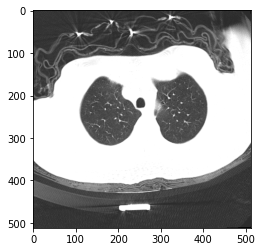

In [4]:
from transform import RandomTranslationRotationZoom
import time
sample = {'image':img,'label':1}
time_s = time.time()
trz_cls = RandomTranslationRotationZoom('trz')
trz_img = trz_cls(sample)['image']
print('%.3f'%(time.time()-time_s))
plt.imshow(trz_img[12],cmap='gray')
plt.show()

In [11]:
print(trz_img.shape)
print(np.min(img))
print(np.min(trz_img))
print(np.max(trz_img))

(58, 512, 512)
0.1764706
0.0
1.0


# Horizontal and vertical flipping

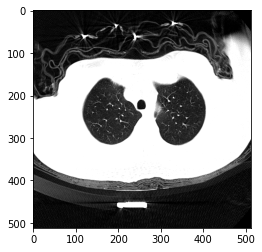

In [5]:
plt.imshow(img[12],cmap='gray')
plt.show()


# plt.imshow(np.flipud(img[12]),cmap='gray')
# plt.show()

# h_flip_img = img[:,::-1,...]
# plt.imshow(h_flip_img[12],cmap='gray')
# plt.show()
# print(h_flip_img.shape)


# plt.imshow(np.fliplr(img[12]),cmap='gray')
# plt.show()

# v_flip_img = img[...,::-1]
# plt.imshow(v_flip_img[12],cmap='gray')
# plt.show()
# print(v_flip_img.shape)



# RandomFlip Class Test

(58, 512, 512)


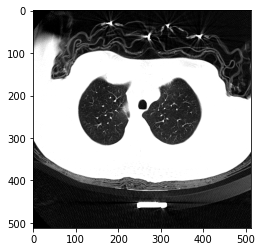

In [6]:
from transform import RandomFlip
sample = {'image':img,'label':1}

rf_cls = RandomFlip('hv')
rf_img = rf_cls(sample)['image']
print(rf_img.shape)

plt.imshow(rf_img[12],cmap='gray')
plt.show()

# GaussNoise

1.5223290763494686 -0.40000169845289923


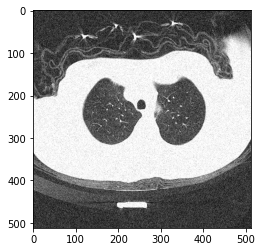

In [12]:
mean = 0.0
std = 0.01**0.5
gauss_noise = np.random.normal(mean,std,img.shape)
gauss_img = img + gauss_noise

print(np.max(gauss_img),np.min(gauss_img))

gauss_img = np.clip(gauss_img,0.0,1.0)

plt.imshow(gauss_img[12],cmap='gray')
plt.show()

# GaussNoise Class Test

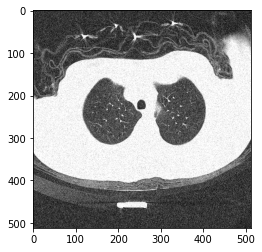

In [7]:
from transform import GaussNoise

sample = {'image':img,'label':1}
gn_cls = GaussNoise()
gn_img = gn_cls(sample)['image']
plt.imshow(gn_img[12],cmap='gray')
plt.show()

# Sequence Test

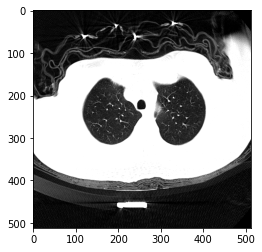

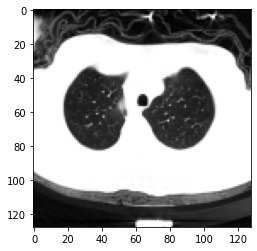

(58, 128, 128)
torch.Size([1, 58, 128, 128])
tensor([0., 1., 0.])


In [9]:
plt.imshow(img[12],cmap='gray')
plt.show()
# final_sample = gn_cls(rf_cls(trz_cls(cr_cls(sample))))
final_sample = rf_cls(cr_cls(sample))
# final_sample = rf_cls(sample)
# final_sample = cr_cls(sample)

final_img = final_sample['image']
plt.imshow(final_img[12],cmap='gray')
plt.show()
print(final_img.shape)


tensor_img = tt_cls(final_sample)['image']
tensor_lab = tt_cls(final_sample)['label']
print(tensor_img.shape)
print(tensor_lab)

# Lung Region Segmentation

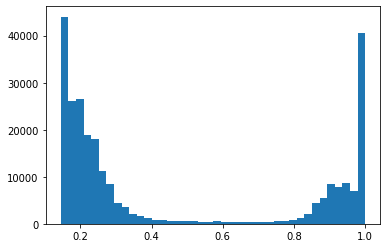

In [294]:
plt.hist(img[43].flatten(), bins=40)
plt.show()

In [329]:
from skimage.exposure.exposure import rescale_intensity
import cv2
from skimage.draw import polygon
from skimage.morphology import remove_small_objects,remove_small_holes


def get_lung(img): 
  img = rescale_intensity(img,out_range=(0,255))  
  img = img.astype(np.uint8)
 
  blur = cv2.GaussianBlur(img,(5,5),0)
  ret,body = cv2.threshold(blur, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  # horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,1))
  # body = cv2.morphologyEx(body, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
  
  body = remove_small_objects(body.astype(bool),min_size=200, connectivity=1)
  body = (body==False)  
  body = remove_small_objects(body,min_size=200, connectivity=1)
  
  contours, hierarchy = cv2.findContours(body.astype(np.uint8),cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE) 
  area =[[i,cv2.contourArea(contours[i])] for i in range(len(contours))]
  area.sort(key=lambda x : x[1],reverse=True)
  print(area)
  
  body = np.zeros_like(body,dtype=np.uint8)
  for i in range(min(len(area),6)):
    if area[i][1] > 1600 and area[i][1] < 40000:
      contour = contours[area[i][0]]
      r = contour[:,0,1]
      c = contour[:,0,0]
      rr,cc = polygon(r,c)
      body[rr,cc] = 1
  
  body = cv2.medianBlur(body,5)  
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
  body = cv2.dilate(body,kernel,iterations=5)
  body = remove_small_holes(body.astype(bool),1000,connectivity=1).astype(np.uint8)  
  return body

[[8, 74879.0], [1, 67685.5], [7, 11188.5], [6, 6718.0], [0, 1111.5], [4, 344.0], [5, 258.0], [3, 215.5], [2, 198.0]]


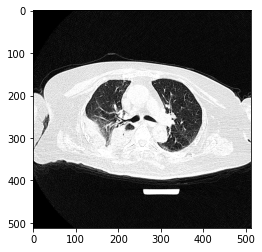

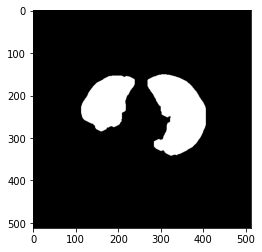

In [330]:
# from skimage.transform import resize
# dim = (img.shape[0],128,128)
# crop_img = img[:,48:-48,48:-48]
# resize_img = resize(crop_img,dim,anti_aliasing=True)

body = get_lung(img[43])
plt.imshow(img[43],cmap='gray')
plt.show()
plt.imshow(body,cmap='gray')
plt.show()

# body = measure.label(body)
# plt.imshow(body,cmap='gray')
# plt.show()
# print(np.unique(body))

0
[[1, 87823.0], [4, 80248.0], [0, 1670.0], [2, 677.0], [3, 277.0]]


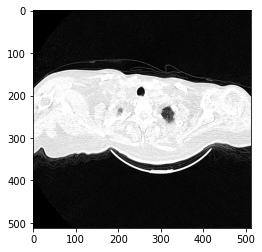

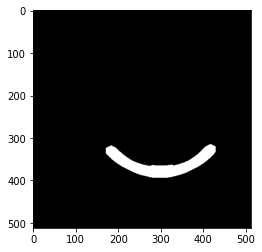

1
[[1, 87250.5], [5, 79966.0], [0, 1647.0], [3, 1051.0], [4, 268.0], [2, 259.5]]


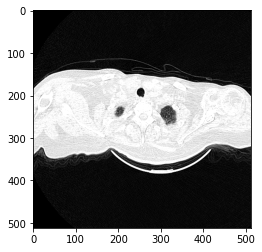

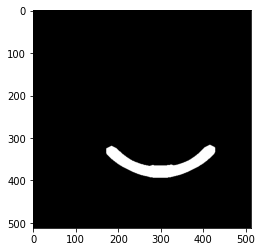

2
[[1, 86690.5], [5, 79728.0], [0, 1640.0], [3, 1395.0], [2, 540.5], [4, 242.5]]


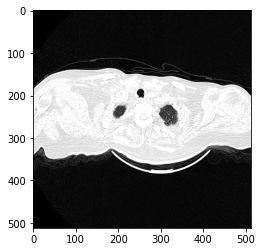

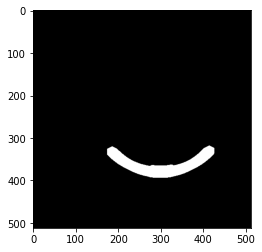

3
[[1, 86133.0], [5, 79486.5], [3, 1765.0], [0, 1617.0], [2, 842.5], [4, 212.0]]


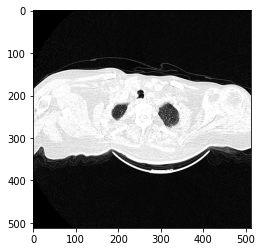

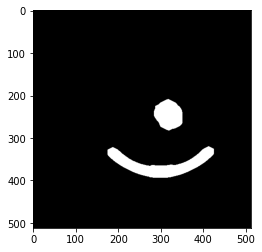

4
[[1, 85575.0], [5, 79245.5], [2, 2203.0], [0, 1602.5], [3, 1167.0], [4, 213.0]]


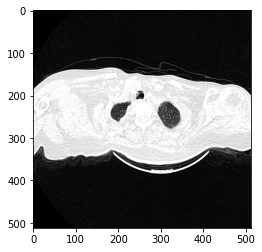

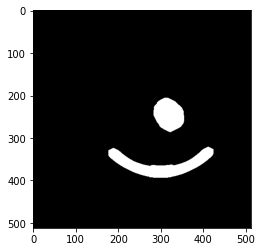

5
[[1, 84990.5], [5, 79045.0], [2, 2564.5], [0, 1600.0], [3, 1368.5], [4, 267.0]]


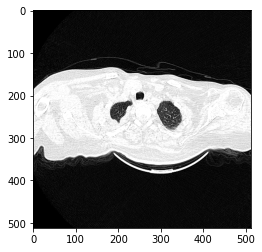

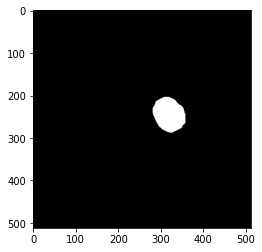

6
[[1, 84408.5], [5, 78860.0], [2, 2923.5], [0, 1592.5], [3, 1531.0], [4, 279.5]]


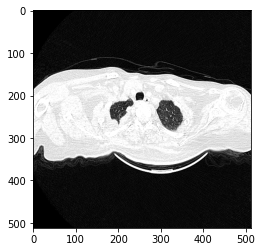

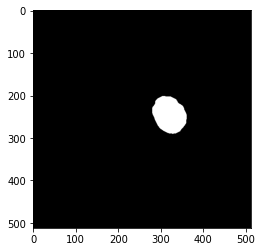

7
[[1, 83837.5], [5, 78613.5], [2, 3295.5], [3, 1697.5], [0, 1549.5], [4, 270.0]]


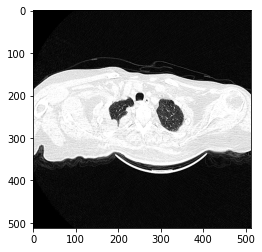

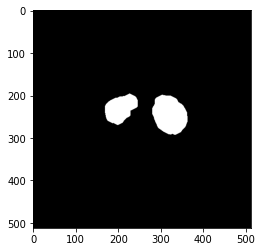

8
[[1, 83280.0], [5, 78416.5], [2, 3647.0], [3, 1864.5], [0, 1505.5], [4, 269.5]]


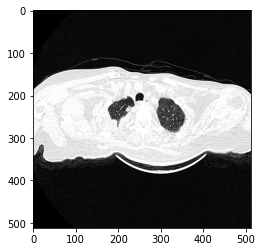

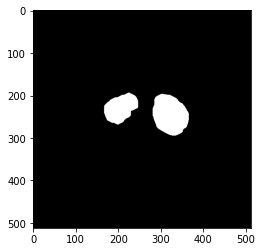

9
[[1, 82744.5], [5, 78253.5], [2, 4023.0], [3, 2036.5], [0, 1465.5], [4, 268.5]]


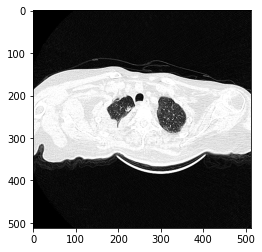

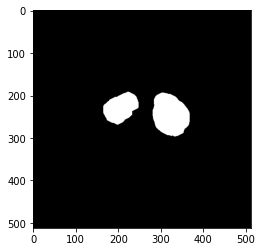

10
[[1, 82265.5], [5, 78096.5], [2, 4226.0], [3, 2396.5], [0, 1493.5], [4, 262.5]]


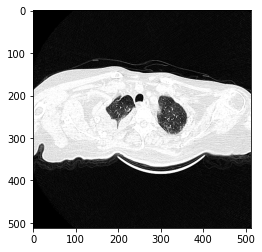

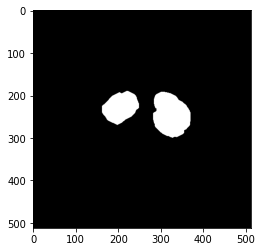

11
[[1, 81789.0], [5, 77940.0], [2, 4438.5], [4, 2638.5], [0, 1556.0], [3, 256.0]]


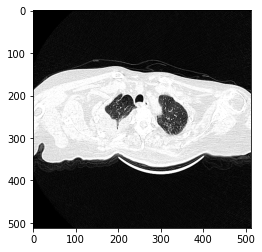

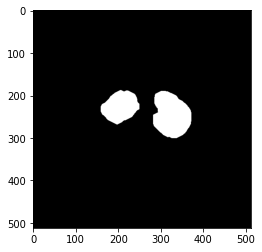

12
[[1, 81288.5], [5, 77795.0], [3, 4584.5], [4, 2859.5], [0, 1631.0], [2, 251.0]]


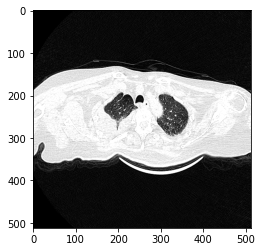

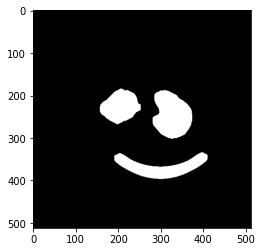

13
[[1, 80796.0], [5, 77652.5], [3, 4712.5], [4, 3042.5], [0, 1695.5], [2, 253.5]]


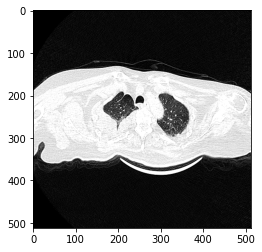

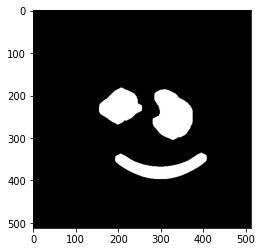

14
[[1, 80290.5], [5, 77505.0], [3, 4865.5], [4, 3249.5], [0, 1772.5], [2, 248.5]]


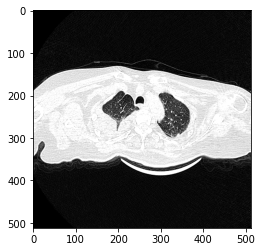

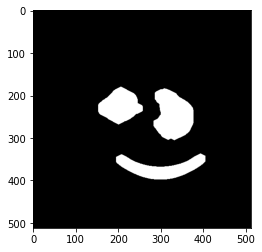

15
[[1, 79801.0], [5, 77369.0], [3, 5040.0], [4, 3444.5], [0, 1857.0], [2, 232.0]]


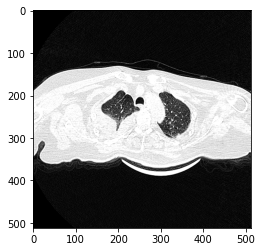

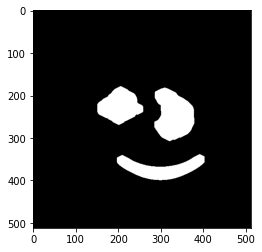

16
[[1, 79338.0], [5, 77252.0], [3, 5237.0], [4, 3679.5], [0, 1934.0], [2, 224.0]]


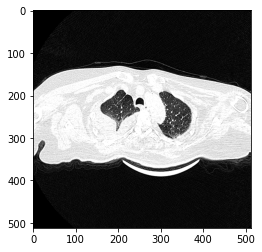

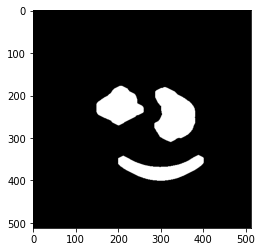

17
[[1, 78893.5], [5, 77138.0], [3, 5515.5], [4, 3884.0], [0, 1981.5], [2, 213.5]]


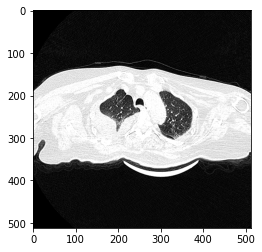

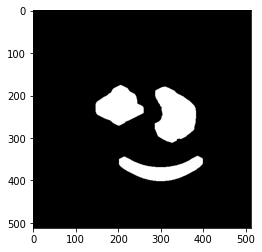

18
[[1, 78416.0], [5, 76983.0], [3, 5760.0], [4, 4043.5], [0, 2011.0], [2, 199.5]]


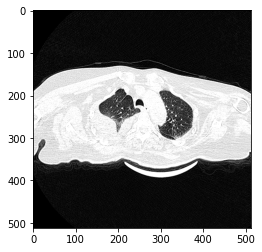

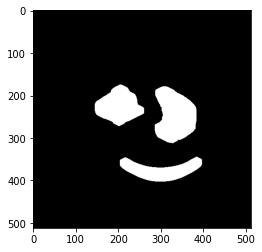

19
[[1, 77951.0], [5, 76828.5], [3, 6091.0], [4, 4233.0], [0, 2097.5], [2, 190.5]]


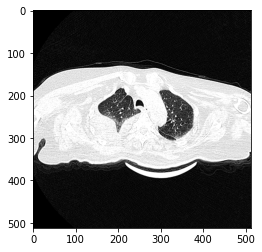

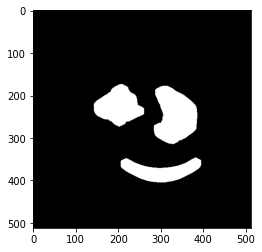

20
[[1, 77450.0], [5, 76696.0], [3, 6412.0], [4, 4360.5], [0, 2146.0], [2, 179.5]]


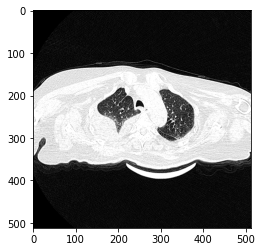

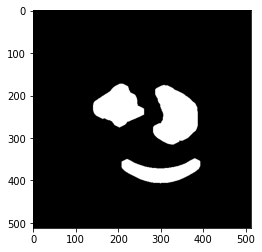

21
[[1, 76948.5], [5, 76594.5], [3, 6722.5], [4, 4577.0], [0, 2219.5], [2, 185.0]]


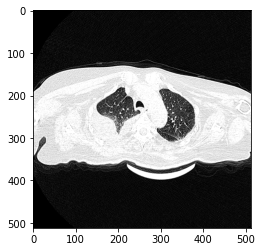

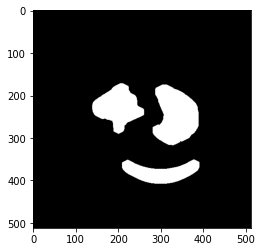

22
[[5, 76490.0], [1, 76400.5], [3, 7044.0], [4, 4662.5], [0, 2264.5], [2, 191.0]]


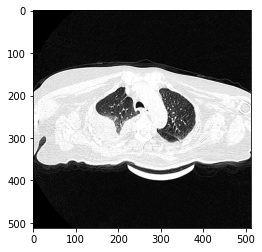

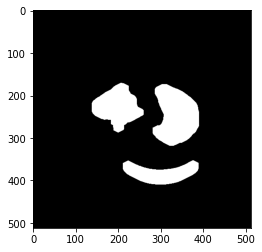

23
[[5, 76406.0], [1, 75862.0], [3, 7328.0], [4, 4623.0], [0, 2291.5], [2, 190.0]]


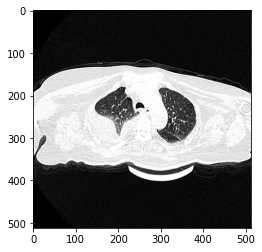

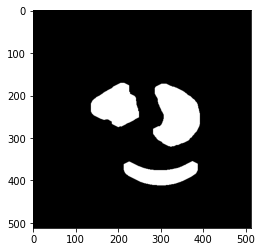

24
[[5, 76313.0], [1, 75299.5], [3, 7651.0], [4, 4737.0], [0, 2275.5], [2, 189.5]]


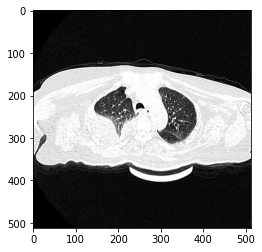

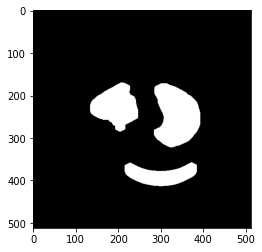

25
[[5, 76238.5], [1, 74737.5], [3, 7922.5], [4, 4803.5], [0, 2246.5], [2, 187.5]]


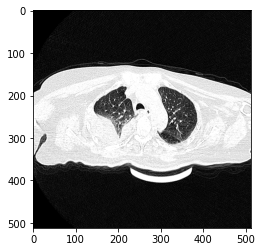

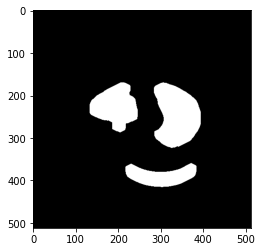

26
[[5, 76137.5], [1, 74275.0], [3, 8161.5], [4, 5281.0], [0, 2201.5], [2, 179.0]]


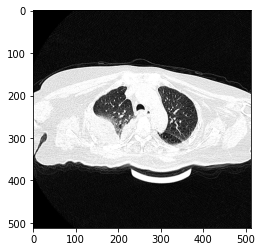

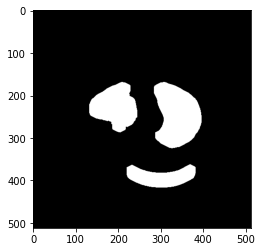

27
[[5, 76083.0], [1, 73803.0], [3, 8415.5], [4, 5584.0], [0, 2132.5], [2, 189.0]]


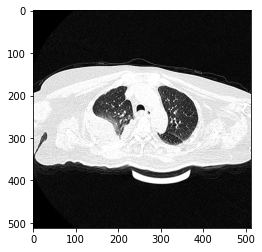

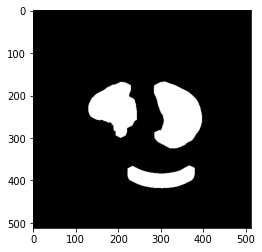

28
[[6, 75983.0], [1, 73080.5], [5, 8673.0], [4, 5629.5], [0, 2077.5], [2, 247.0], [3, 198.5]]


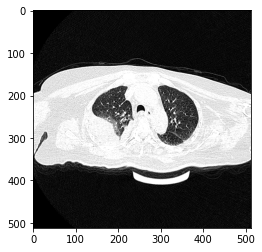

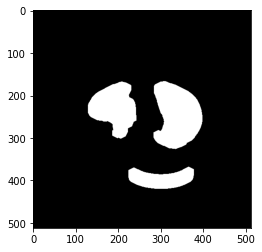

29
[[6, 75890.0], [1, 72548.0], [5, 8962.0], [4, 5565.5], [0, 2015.5], [2, 237.5], [3, 203.5]]


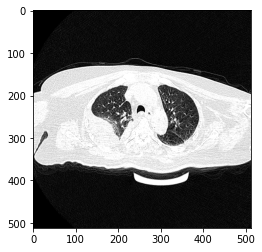

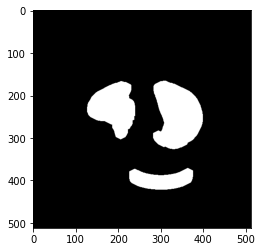

30
[[6, 75761.5], [1, 71983.5], [5, 9231.5], [4, 5690.5], [0, 1940.5], [2, 233.5], [3, 209.5]]


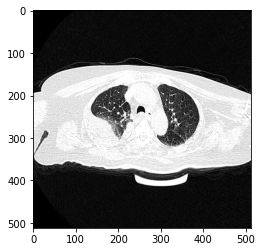

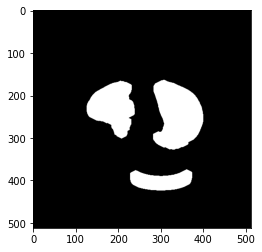

31
[[7, 75648.5], [1, 71438.5], [6, 9510.0], [5, 5896.0], [0, 1846.0], [3, 341.5], [2, 224.0], [4, 211.5]]


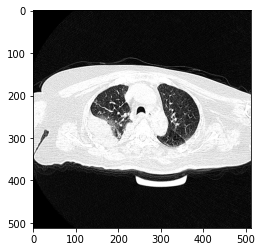

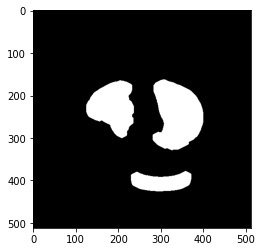

32
[[7, 75529.5], [1, 70974.5], [6, 9780.5], [5, 6080.0], [0, 1758.5], [3, 356.0], [4, 215.5], [2, 207.5]]


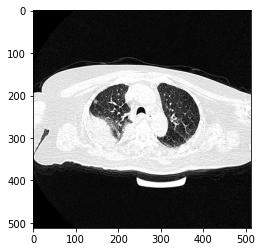

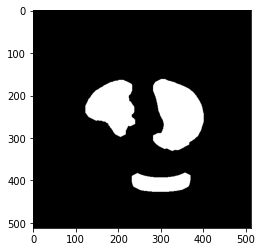

33
[[7, 75404.0], [1, 70540.0], [6, 10012.5], [5, 6184.0], [0, 1692.0], [3, 321.0], [4, 208.0], [2, 200.0]]


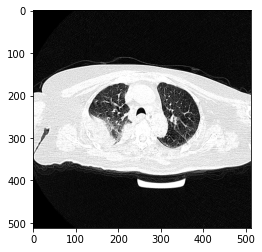

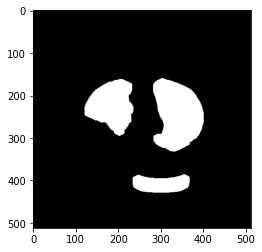

34
[[7, 75253.5], [1, 70139.5], [6, 10215.0], [5, 6004.5], [0, 1633.5], [3, 356.5], [4, 207.0], [2, 197.0]]


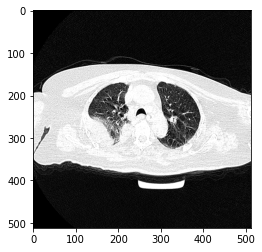

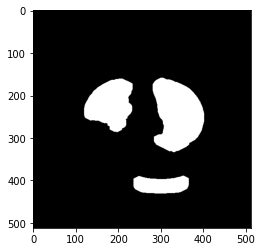

35
[[7, 75210.5], [1, 69668.0], [6, 10411.0], [5, 6395.0], [0, 1565.5], [3, 364.5], [4, 225.5], [2, 180.0]]


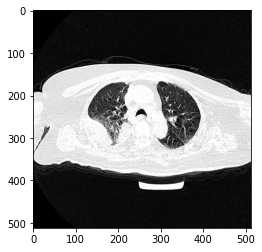

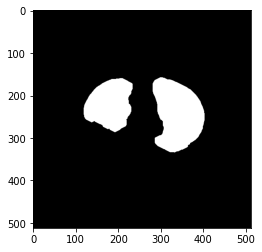

36
[[6, 75555.5], [1, 69274.0], [5, 10248.5], [4, 6451.5], [0, 1516.0], [3, 261.0], [2, 186.0]]


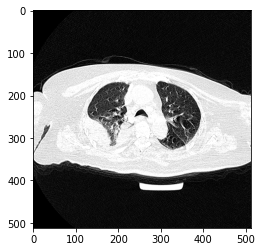

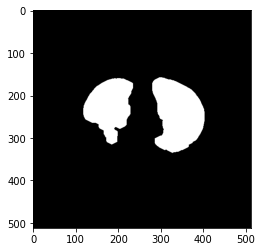

37
[[6, 75481.5], [1, 68990.5], [5, 10588.0], [4, 6648.5], [0, 1467.0], [3, 322.5], [2, 196.0]]


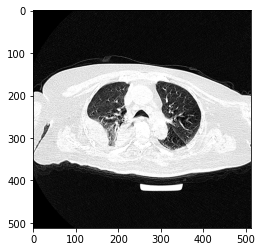

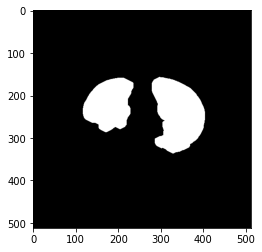

38
[[7, 75332.0], [1, 68710.5], [6, 10846.0], [5, 5846.5], [0, 1413.5], [4, 723.0], [3, 378.0], [2, 210.0]]


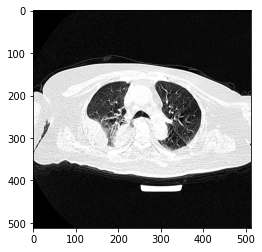

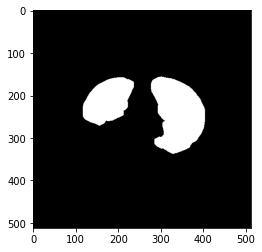

39
[[7, 75199.0], [1, 68396.0], [6, 10897.5], [5, 6034.0], [0, 1359.5], [3, 418.0], [4, 403.5], [2, 236.5]]


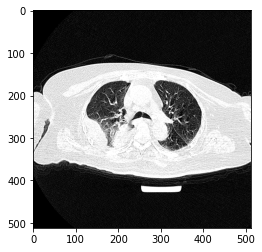

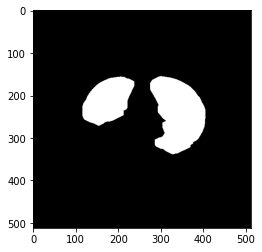

40
[[7, 75104.0], [1, 68152.0], [6, 10972.0], [5, 6451.0], [0, 1290.0], [3, 445.5], [4, 262.5], [2, 245.5]]


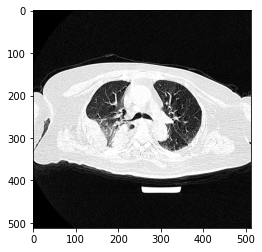

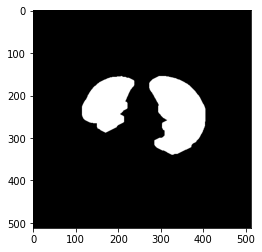

41
[[7, 75026.5], [1, 67961.5], [6, 11263.0], [5, 6611.0], [0, 1268.5], [3, 507.5], [4, 411.0], [2, 256.5]]


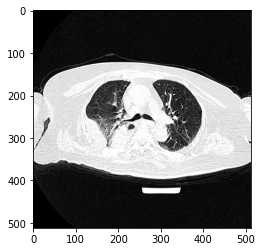

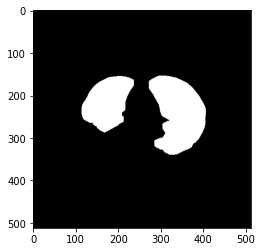

42
[[7, 74945.5], [1, 67795.5], [6, 10966.0], [5, 6617.0], [0, 1168.5], [4, 349.0], [2, 249.5], [3, 220.0]]


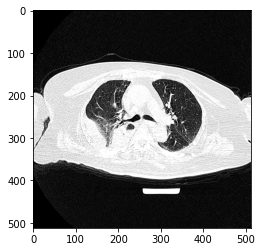

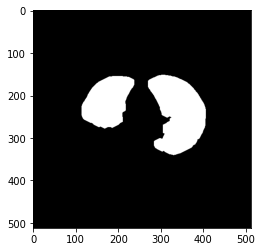

43
[[8, 74879.0], [1, 67685.5], [7, 11188.5], [6, 6718.0], [0, 1111.5], [4, 344.0], [5, 258.0], [3, 215.5], [2, 198.0]]


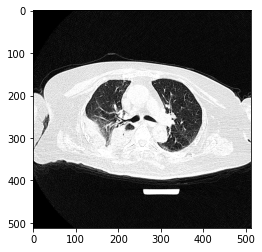

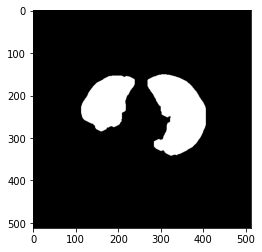

44
[[8, 74793.5], [1, 67618.0], [7, 11337.5], [6, 6328.0], [0, 1097.0], [4, 277.5], [5, 275.0], [2, 248.0], [3, 217.0]]


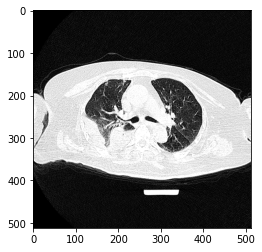

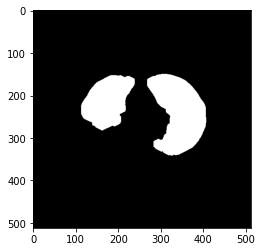

45
[[9, 74760.0], [1, 67574.0], [8, 11423.5], [7, 5926.0], [0, 1035.5], [6, 311.5], [2, 295.5], [5, 212.0], [4, 190.0], [3, 186.5]]


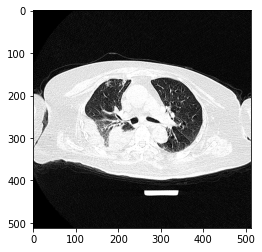

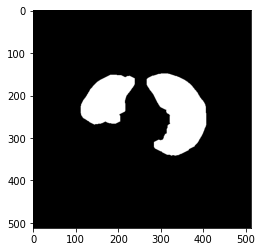

46
[[6, 75140.5], [1, 67584.0], [5, 11403.0], [4, 5982.0], [0, 987.5], [2, 321.5], [3, 191.5]]


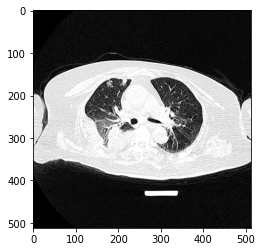

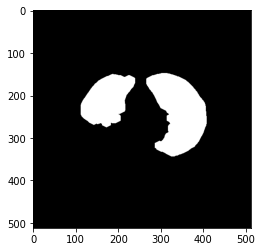

47
[[6, 75241.5], [1, 67637.0], [5, 11655.0], [4, 6140.0], [0, 929.5], [2, 303.0], [3, 167.0]]


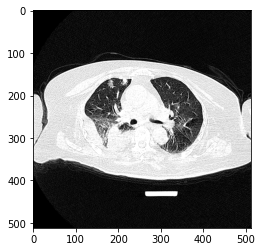

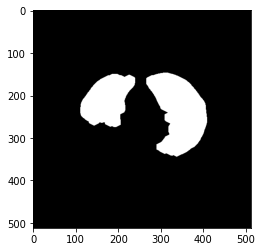

48
[[5, 75063.0], [1, 67676.5], [4, 11356.5], [3, 6047.0], [0, 891.5], [2, 292.0]]


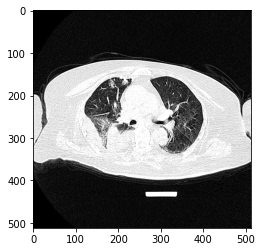

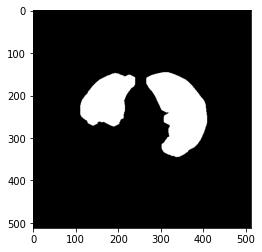

49
[[5, 74943.0], [1, 67757.5], [4, 11719.0], [3, 6737.0], [0, 863.0], [2, 324.0]]


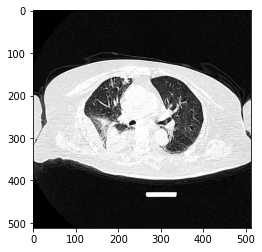

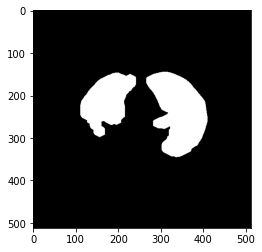

50
[[6, 74850.5], [1, 67860.0], [5, 11709.5], [4, 6557.0], [0, 841.5], [2, 399.5], [3, 207.5]]


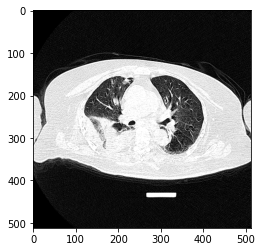

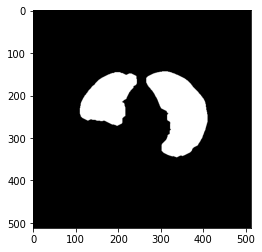

51
[[5, 74939.5], [1, 68021.0], [4, 11253.0], [3, 6369.5], [0, 774.5], [2, 479.0]]


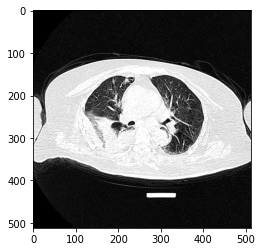

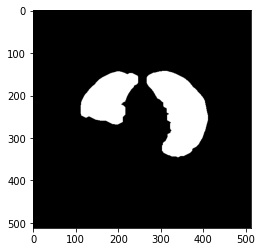

52
[[5, 74736.5], [1, 68193.0], [4, 11318.0], [3, 6885.0], [0, 810.5], [2, 372.5]]


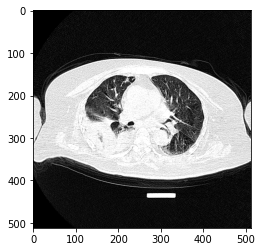

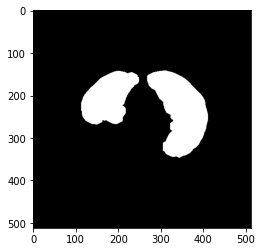

53
[[5, 74504.5], [1, 68362.0], [4, 10977.0], [3, 7246.5], [0, 736.5], [2, 296.0]]


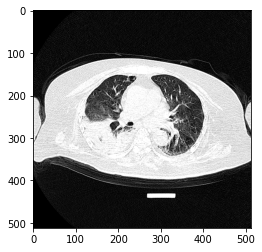

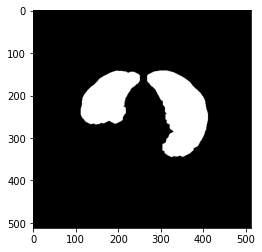

54
[[6, 74300.5], [1, 68529.5], [5, 10159.0], [4, 7361.5], [0, 752.5], [2, 338.0], [3, 321.0]]


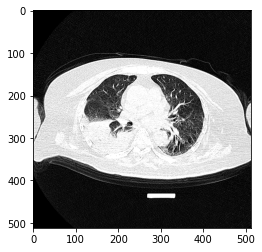

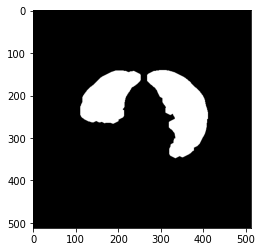

55
[[5, 73962.0], [1, 68687.5], [4, 11070.5], [3, 7423.0], [0, 787.5], [2, 358.0]]


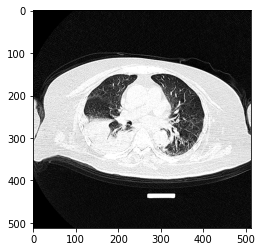

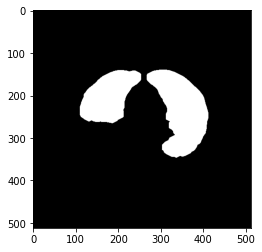

56
[[6, 73576.0], [1, 68876.0], [5, 10493.0], [4, 7492.5], [0, 784.5], [3, 438.0], [2, 276.0]]


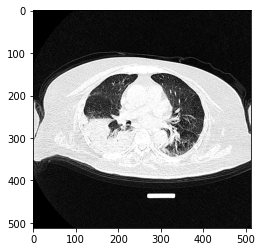

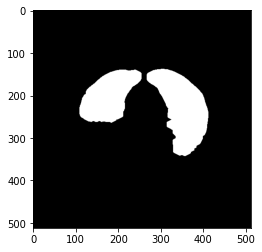

57
[[5, 73276.0], [1, 69071.0], [4, 10402.5], [3, 7554.0], [0, 781.0], [2, 485.0]]


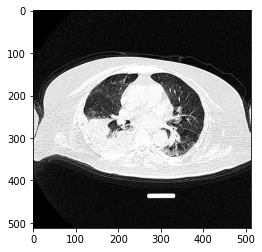

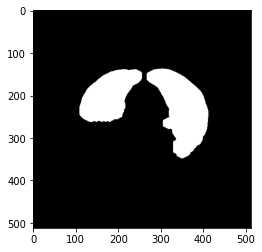

58
[[5, 72723.5], [1, 69236.5], [4, 10375.5], [3, 7481.5], [0, 779.5], [2, 406.5]]


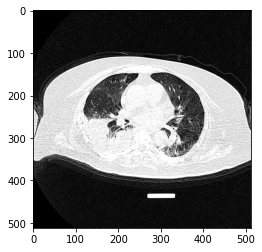

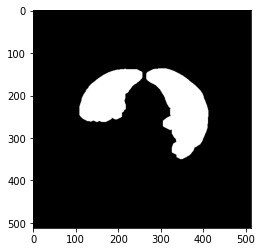

59
[[6, 72066.5], [1, 69375.0], [5, 10477.0], [4, 7237.0], [0, 778.0], [3, 509.5], [2, 195.5]]


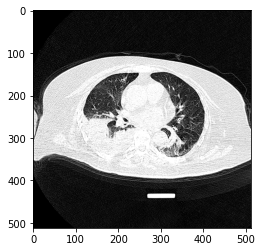

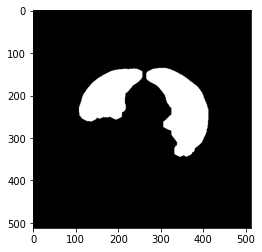

60
[[9, 71406.5], [3, 63568.0], [8, 10317.0], [7, 7328.0], [2, 3502.5], [0, 771.5], [1, 334.5], [6, 328.0], [4, 207.5], [5, 170.5]]


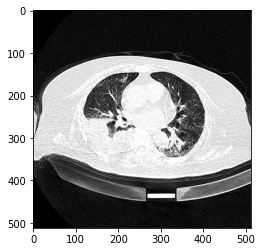

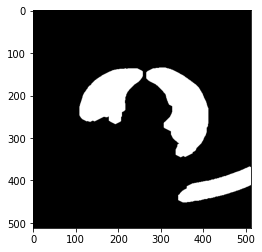

61
[[7, 70760.5], [2, 54738.5], [6, 10258.0], [5, 7441.0], [1, 4906.5], [0, 4028.0], [4, 316.0], [3, 229.0]]


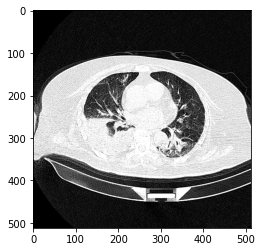

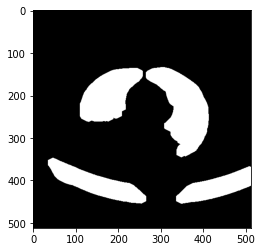

62
[[7, 70122.5], [3, 53853.0], [6, 9879.0], [5, 7612.5], [2, 5109.0], [1, 4065.0], [0, 431.5], [4, 266.5]]


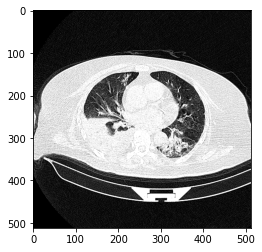

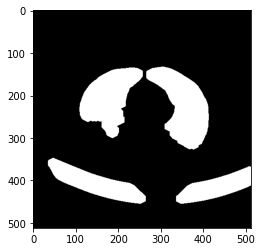

63
[[7, 69665.0], [3, 53843.0], [6, 9827.5], [5, 7469.5], [2, 5110.5], [1, 4052.0], [0, 429.5], [4, 285.5]]


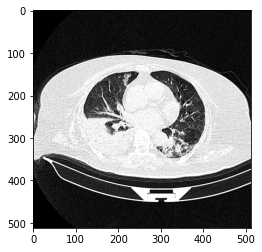

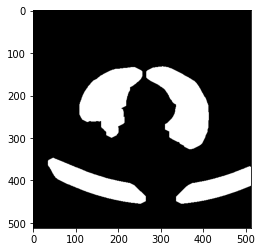

64
[[8, 68865.0], [3, 53889.0], [7, 10334.0], [6, 7923.0], [2, 5078.0], [1, 4046.0], [0, 429.0], [4, 278.5], [5, 172.5]]


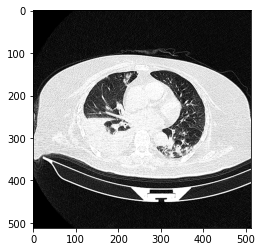

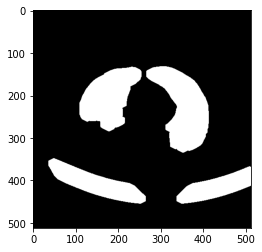

65
[[7, 68104.0], [3, 53918.0], [6, 10611.5], [5, 7690.5], [2, 5058.5], [1, 4042.0], [0, 425.5], [4, 370.0]]


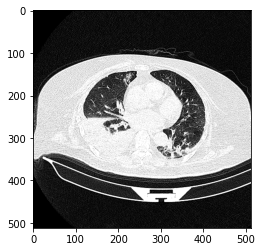

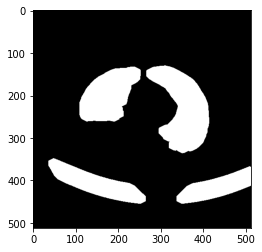

66
[[7, 67463.5], [3, 53960.5], [6, 10678.5], [5, 7915.5], [2, 5051.5], [1, 4051.5], [4, 424.5], [0, 418.0]]


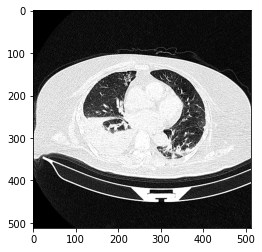

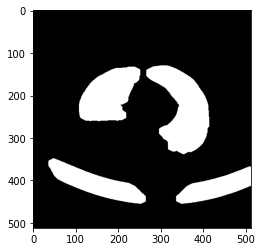

67
[[9, 66854.0], [3, 53986.5], [8, 10519.5], [7, 7914.5], [2, 5046.0], [1, 4042.0], [6, 472.5], [0, 397.5], [5, 186.0], [4, 181.5]]


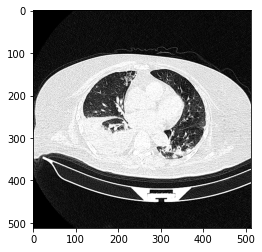

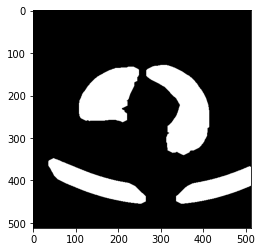

68
[[7, 66359.0], [3, 54025.5], [6, 10431.0], [5, 8216.5], [2, 5036.0], [1, 4028.0], [4, 541.5], [0, 367.5]]


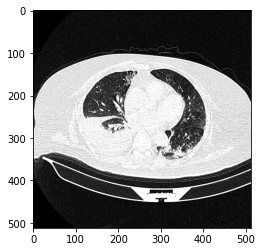

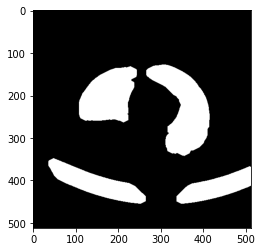

69
[[9, 65850.5], [3, 54040.0], [8, 10429.0], [7, 8456.0], [2, 5044.5], [1, 4021.5], [4, 613.0], [0, 349.5], [5, 279.5], [6, 253.0]]


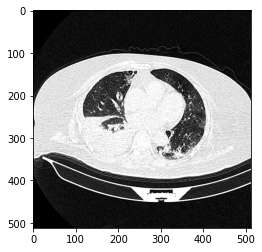

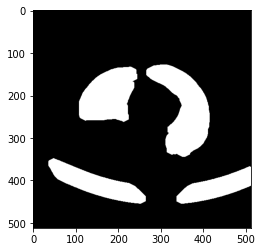

70
[[8, 65484.5], [4, 54006.5], [7, 10490.5], [6, 8454.0], [2, 5037.0], [1, 4027.5], [5, 647.5], [0, 341.0], [3, 213.5]]


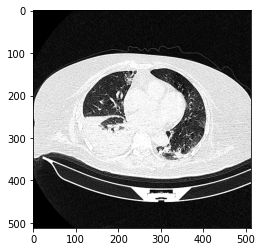

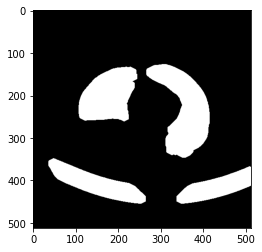

71
[[8, 65129.5], [4, 54053.0], [7, 10467.5], [6, 8280.5], [2, 5035.0], [1, 4025.0], [5, 716.0], [0, 311.5], [3, 209.5]]


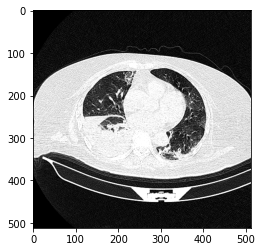

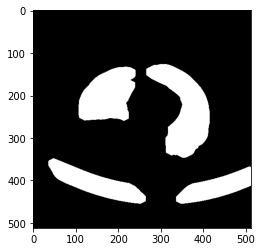

72
[[8, 64811.0], [4, 54065.5], [7, 10440.5], [6, 8150.5], [2, 5045.5], [1, 4030.5], [5, 728.5], [0, 311.0], [3, 196.5]]


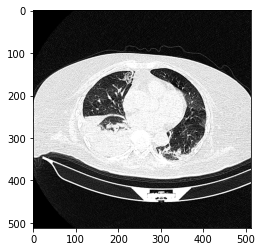

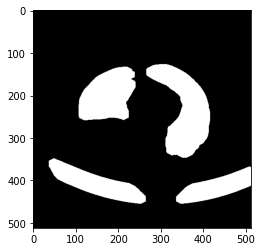

73
[[8, 64550.0], [4, 54021.0], [7, 10425.0], [6, 7717.5], [2, 5043.5], [1, 4032.0], [5, 745.0], [0, 309.0], [3, 167.0]]


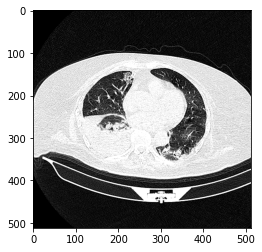

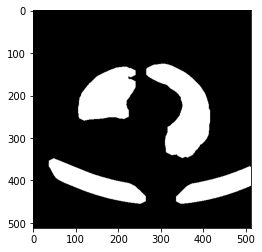

74
[[9, 64327.0], [3, 54029.0], [8, 10368.0], [7, 8027.0], [2, 5044.0], [1, 4031.5], [6, 949.5], [5, 777.5], [0, 307.0], [4, 157.5]]


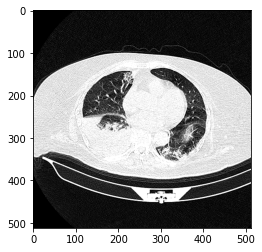

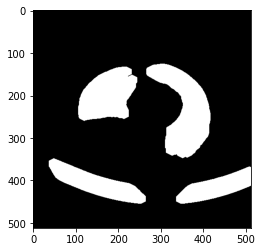

75
[[7, 64086.0], [3, 54024.5], [5, 9319.5], [6, 8490.5], [2, 5048.5], [1, 4026.5], [0, 304.5], [4, 150.0]]


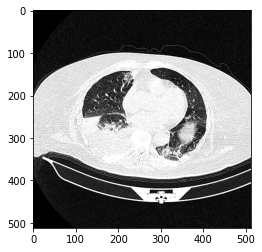

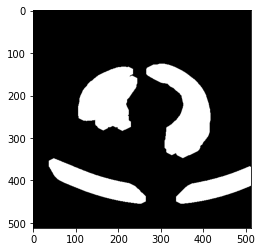

76
[[6, 63811.5], [3, 54073.0], [4, 9492.5], [5, 7311.0], [2, 5048.5], [1, 4028.0], [0, 298.0]]


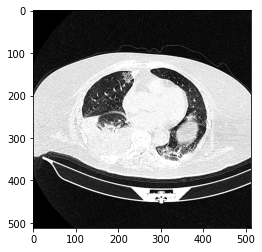

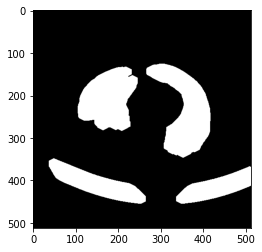

77
[[6, 63529.0], [3, 54124.5], [4, 9462.0], [5, 6773.5], [2, 5039.5], [1, 4026.0], [0, 308.5]]


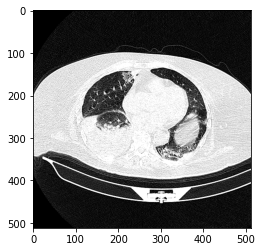

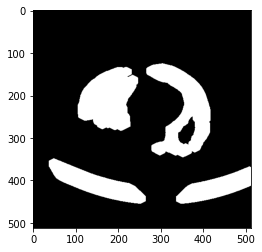

78
[[8, 63286.0], [3, 54175.5], [6, 9565.5], [2, 5045.5], [7, 4423.0], [1, 4024.5], [5, 1109.5], [4, 871.0], [0, 372.5]]


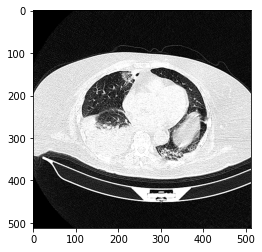

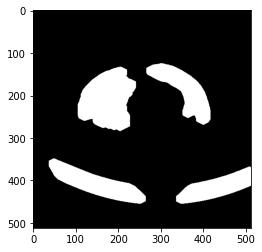

79
[[8, 63057.0], [3, 54224.5], [6, 9741.5], [2, 5040.5], [7, 4450.5], [1, 4024.0], [5, 777.0], [4, 622.0], [0, 369.0]]


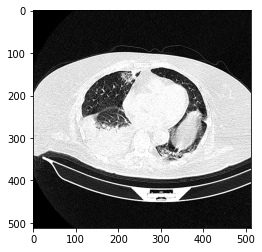

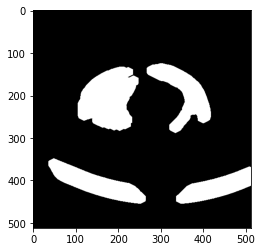

80
[[8, 62821.0], [3, 54253.5], [6, 9742.5], [2, 5036.0], [7, 4209.0], [1, 4024.5], [5, 763.0], [0, 357.0], [4, 299.5]]


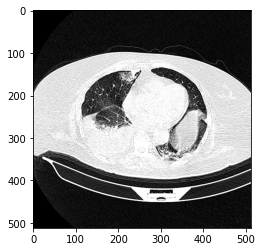

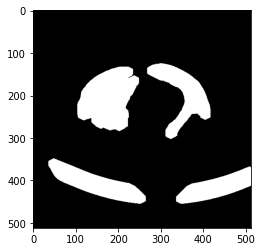

81
[[9, 62603.0], [3, 54324.0], [7, 9852.0], [2, 5035.5], [1, 4026.5], [8, 3755.5], [5, 741.5], [4, 615.0], [0, 368.0], [6, 364.0]]


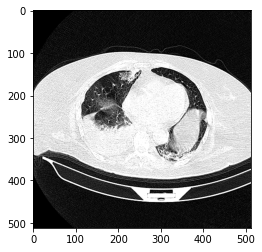

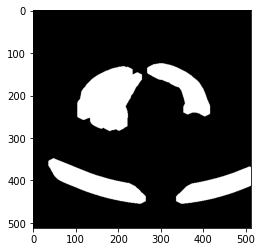

82
[[9, 62432.5], [3, 54370.5], [7, 6569.0], [2, 5042.5], [1, 4021.0], [8, 3561.5], [6, 2476.0], [5, 578.0], [0, 361.0], [4, 279.5]]


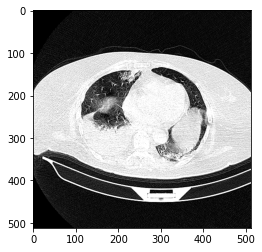

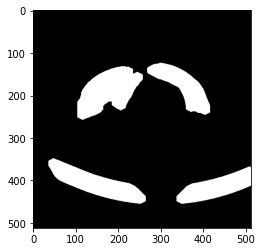

83
[[8, 62315.5], [3, 54411.0], [6, 8838.0], [2, 5040.5], [1, 4019.5], [7, 3445.5], [4, 401.0], [0, 354.0], [5, 353.0]]


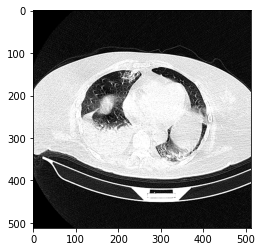

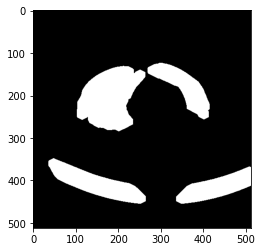

84
[[8, 62279.5], [3, 54472.5], [6, 8676.0], [2, 5032.5], [1, 4028.0], [7, 3358.5], [4, 458.5], [0, 350.0], [5, 196.5]]


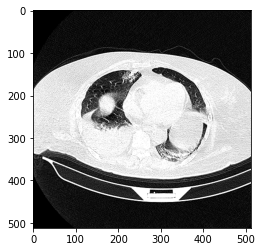

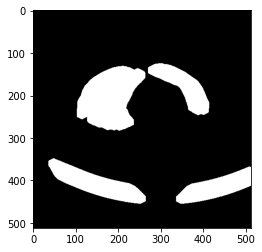

85
[[7, 62173.5], [3, 54514.5], [5, 8450.5], [2, 5020.5], [1, 4026.5], [6, 3133.0], [4, 496.0], [0, 339.0]]


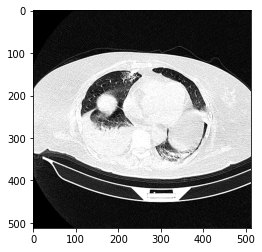

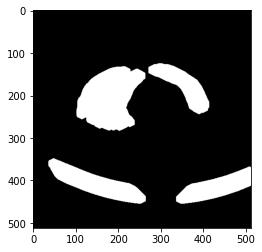

86
[[8, 62038.5], [3, 54564.5], [6, 5831.5], [2, 5014.5], [1, 4019.0], [7, 2921.5], [5, 2042.0], [4, 503.5], [0, 345.5]]


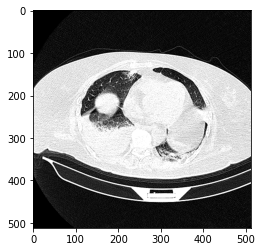

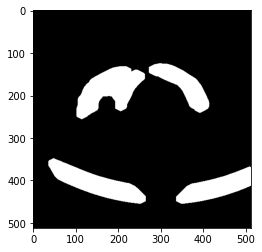

87
[[8, 61842.0], [3, 54627.5], [6, 5510.5], [2, 5020.5], [1, 4016.5], [7, 2710.0], [5, 1708.0], [4, 482.5], [0, 345.5]]


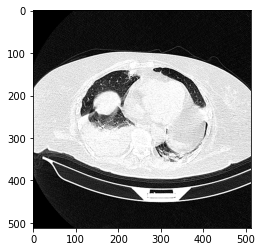

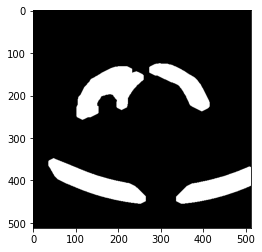

88
[[8, 61679.0], [3, 54679.5], [6, 5063.5], [2, 5019.5], [1, 4017.5], [7, 2486.0], [5, 1636.5], [4, 474.5], [0, 345.5]]


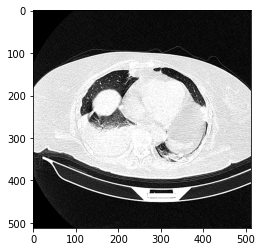

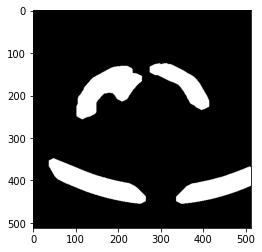

89
[[8, 61545.5], [3, 54682.0], [2, 5024.5], [6, 4651.0], [1, 4019.5], [7, 2195.5], [5, 1473.5], [4, 467.5], [0, 345.0]]


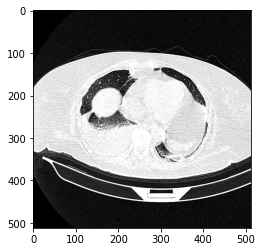

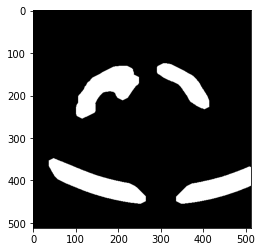

90
[[9, 61388.0], [3, 54704.0], [2, 5024.0], [1, 4012.5], [7, 3702.5], [8, 2015.0], [5, 1229.5], [4, 397.5], [6, 372.0], [0, 351.0]]


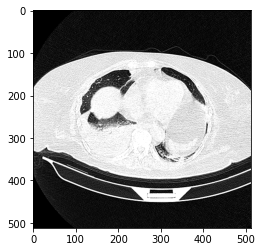

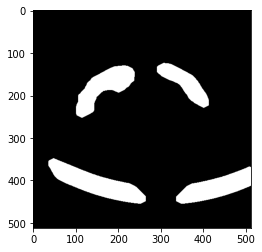

91
[[9, 61234.5], [3, 54718.5], [2, 5023.5], [1, 4012.0], [7, 3326.5], [8, 1805.0], [5, 416.0], [6, 398.5], [4, 364.5], [0, 352.0]]


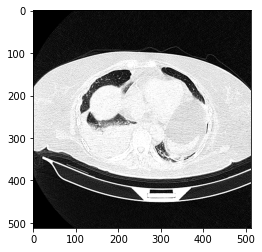

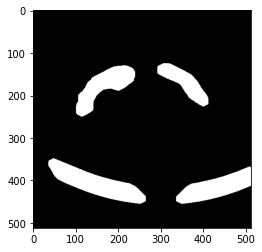

92
[[9, 61130.5], [3, 54755.0], [2, 5034.0], [1, 4008.0], [7, 2934.5], [8, 1635.0], [0, 358.0], [6, 357.0], [4, 245.5], [5, 201.0]]


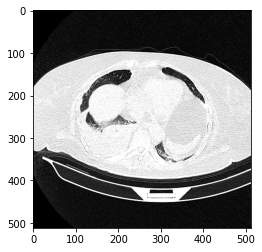

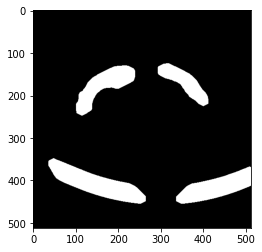

93
[[8, 61144.0], [3, 54822.0], [2, 5035.0], [1, 4011.0], [6, 2557.5], [7, 1489.5], [0, 346.0], [5, 306.5], [4, 210.0]]


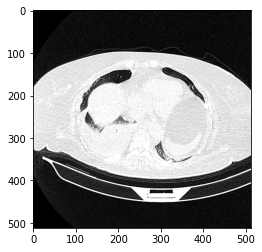

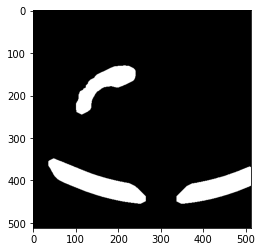

94
[[8, 61304.5], [3, 54899.0], [2, 5042.5], [1, 4014.5], [6, 2209.0], [7, 1299.0], [0, 343.5], [5, 273.0], [4, 159.5]]


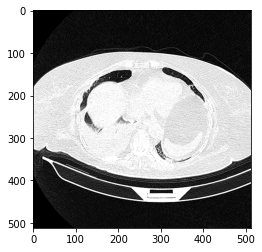

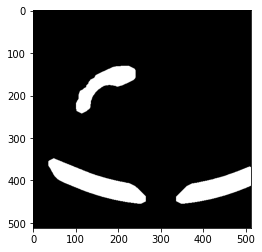

95
[[8, 61244.5], [3, 54971.5], [2, 5030.5], [1, 4017.5], [6, 1845.5], [7, 899.0], [0, 342.5], [5, 252.5], [4, 242.0]]


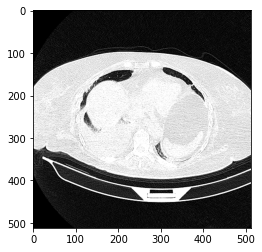

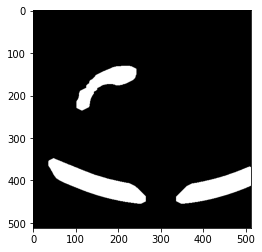

96
[[9, 61143.5], [3, 55073.5], [2, 5027.0], [1, 4003.0], [7, 1404.5], [8, 820.5], [0, 347.0], [5, 193.0], [4, 185.0], [6, 184.5]]


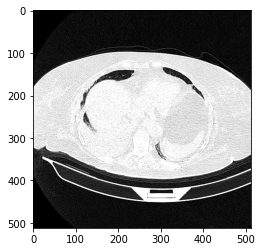

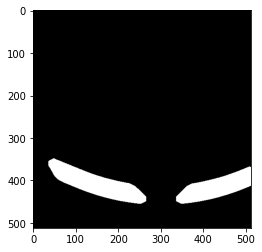

97
[[6, 61059.5], [3, 55194.0], [2, 5029.5], [1, 4008.0], [4, 1286.5], [5, 750.5], [0, 344.5]]


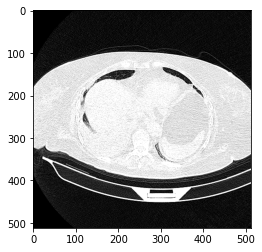

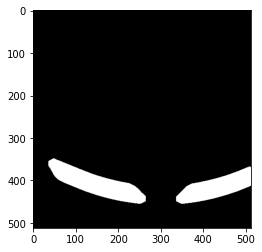

98
[[6, 60974.0], [3, 55313.5], [2, 5040.0], [1, 4006.5], [4, 1138.5], [5, 651.0], [0, 353.0]]


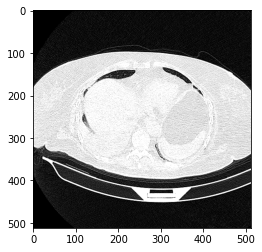

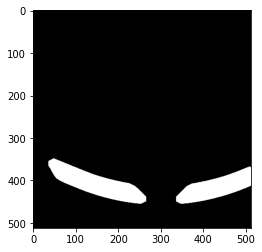

99
[[6, 60895.5], [3, 55439.0], [2, 5034.5], [1, 4006.0], [4, 1007.5], [5, 558.5], [0, 356.0]]


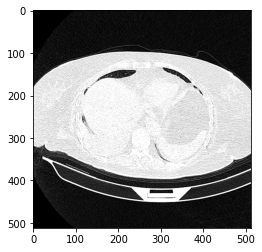

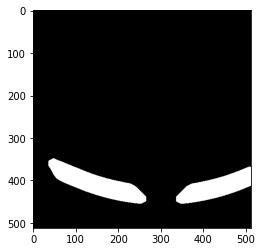

100
[[6, 60842.5], [3, 55550.5], [2, 5043.5], [1, 4008.0], [4, 879.0], [5, 464.5], [0, 349.5]]


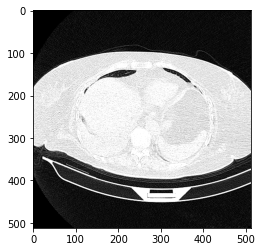

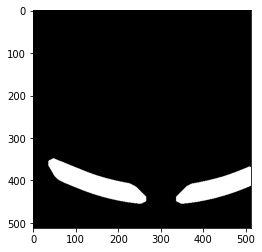

101
[[6, 60810.0], [3, 55669.0], [2, 5045.5], [1, 4011.5], [4, 735.0], [5, 371.0], [0, 350.5]]


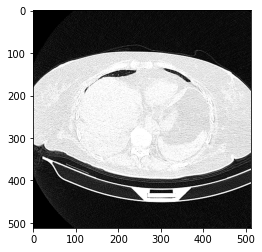

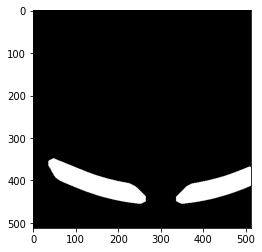

102
[[6, 60717.5], [3, 55805.5], [2, 5044.5], [1, 4008.5], [4, 622.5], [0, 348.0], [5, 283.0]]


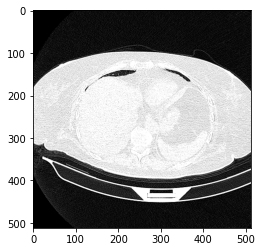

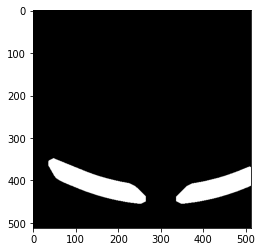

103
[[6, 60519.5], [3, 55903.0], [2, 5033.5], [1, 4011.5], [4, 519.0], [0, 345.5], [5, 236.0]]


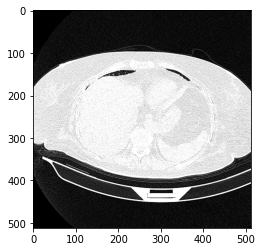

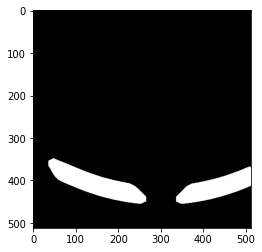

104
[[6, 60428.0], [3, 55990.0], [2, 5033.5], [1, 4012.5], [4, 481.5], [0, 337.5], [5, 173.5]]


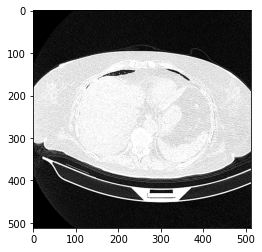

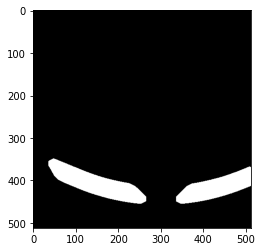

105
[[5, 60456.5], [3, 56069.0], [2, 5026.0], [1, 4017.0], [4, 445.5], [0, 344.5]]


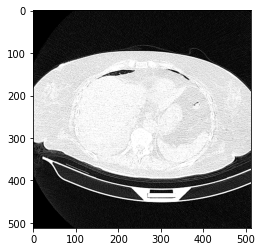

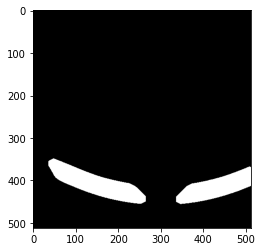

106
[[5, 60560.0], [3, 56154.5], [2, 5020.5], [1, 4011.0], [4, 379.5], [0, 346.5]]


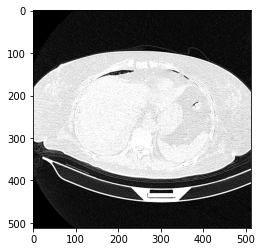

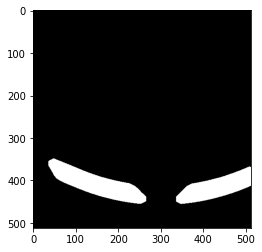

In [331]:
for i in range(img.shape[0]):
    print(i)
    body = get_lung(img[i])
    plt.imshow(img[i],cmap='gray')

    plt.show()
    plt.imshow(body,cmap='gray')
    plt.show()